[run_class_finetuning](https://github.com/OpenGVLab/VideoMAEv2/blob/master/run_class_finetuning.py#L24)

[engine_for_finetuning](https://github.com/OpenGVLab/VideoMAEv2/blob/master/engine_for_finetuning.py#L35)

In [1]:
%matplotlib inline

import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE" # tells OpenMP to not complain if it notices that two copies of OpenMP are loaded.

from IPython.display import Video
from IPython.display import Audio as play_audio
from torchvision.utils import make_grid
from torchcodec.encoders import VideoEncoder

def play_video(encoded_bytes):
    return Video(data=encoded_bytes.numpy().tobytes(),
                embed=True, width=640, height=360, mimetype="video/mp4")

import matplotlib.pyplot as plt

import sys
sys.path.append('../../../../')

In [2]:
from pathlib import Path
import math
import time
import random
import datetime
from functools import partial

import torch
import numpy as np
from PIL import Image

%load_ext autoreload
%autoreload 2

from computer_vision.video_mae.finetune_parameter_parser import parser
from computer_vision.video_mae.dataset.datasets import VideoClsDataset
from computer_vision.video_mae.utils import multiple_samples_collate, seed_worker
from computer_vision.video_mae.dataset.mixup import Mixup, rand_bbox_minmax, rand_bbox, cutmix_bbox_and_lam, one_hot, mixup_target

In [3]:
data_dirpath=Path('D:/data/UCF101')
root=data_dirpath/'UCF-101'
train_annotation_path=data_dirpath/'UCF101TrainTestSplits-RecognitionTask/trainlist01.txt'
val_annotation_path=data_dirpath/'UCF101TrainTestSplits-RecognitionTask/vallist01.txt'

mini_train=False
if not mini_train:
    pretrain_path=Path('D:/results/ucf101/video_mae/train/checkpoints/last.pth') 
    output_dirpath=Path('D:/results/ucf101/video_mae/finetune') 
    arguments= f"""--data_root {root} --train_data_path {train_annotation_path} --val_data_path {val_annotation_path} 
    --output_dir {output_dirpath} --finetune {pretrain_path} 
    --data_set UCF101 --nb_classes 101  --batch_size 3 --input_size 224 --cutmix 1. --mixup 0.8
    --short_side_size 224 --num_frames 16 --sampling_rate 4 --num_sample 2 --num_workers 0 --opt adamw
    --lr 1e-3 --drop_path 0.3 --clip_grad 5.0 --layer_decay 0.9 --opt_betas 0.9 0.999 --weight_decay 0.1
    --test_num_segment 5 --test_num_crop 3 --dist_eval
    --warmup_epochs 5 --epochs 35  --print_freq 20 --device cpu --time 12 --resume
    """ # --use-cutmix-mixup
else:
    pretrain_path=Path('D:/results/ucf101/video_mae/mini_train/checkpoints/last.pth') 
    output_dirpath=Path('D:/results/ucf101/video_mae/mini_finetune') 
    arguments= f"""--data_root {root} --train_data_path {train_annotation_path} --val_data_path {val_annotation_path} 
    --output_dir {output_dirpath}  --finetune {pretrain_path} 
    --data_set UCF101 --nb_classes 101  --batch_size 3 --input_size 224 --cutmix 1. --mixup 0.8
    --short_side_size 224 --num_frames 16 --sampling_rate 4 --num_sample 2 --num_workers 0 --opt adamw
    --lr 1e-3 --drop_path 0.3 --clip_grad 5.0 --layer_decay 0.9 --opt_betas 0.9 0.999 --weight_decay 0.1
    --test_num_segment 5 --test_num_crop 3 --dist_eval 
    --warmup_epochs 5 --print_freq 20 --epochs 35  --device cpu --resume
    --n_steps 12 --n_epochs 2 --time 0.5
    """ # --use-cutmix-mixup --time 18 --resume

known_args, _=parser.parse_known_args(args=arguments.split())
if known_args.enable_deepspeed:
    parser=deepspeed.add_config_arguments(parser)
    ds_init=deepspeed.initialize
else: ds_init=None
args=parser.parse_args(arguments.split())


In [4]:
args.output_dir=Path(args.output_dir)
args.output_dir.mkdir(parents=True, exist_ok=True)
args.checkpoint_dir=args.output_dir/"checkpoints"
args.checkpoint_dir.mkdir(parents=True, exist_ok=True)
args.last=args.checkpoint_dir/args.last
args.best=args.checkpoint_dir/args.best
print(f"{args.last=}")
print(f"{args.best=}")

device=torch.device(args.device) if (torch.cuda.is_available() and args.device=='cuda') else torch.device('cpu')
print(f"{device=}")

torch.manual_seed(args.seed)
np.random.seed(args.seed)
random.seed(args.seed)

args.last=WindowsPath('D:/results/ucf101/video_mae/finetune/checkpoints/last.pth')
args.best=WindowsPath('D:/results/ucf101/video_mae/finetune/checkpoints/best.pth')
device=device(type='cpu')


In [5]:
args.nb_classes=101
dataset_train=VideoClsDataset(data_root=args.data_root, anno_path=args.train_data_path, mode='train', clip_len=args.num_frames, 
                        frame_sample_rate=args.sampling_rate, num_segment=1, test_num_segment=args.test_num_segment,
                        test_num_crop=args.test_num_crop, num_crop=1, keep_aspect_ratio=True, crop_size=args.input_size,
                        short_side_size=args.short_side_size, new_height=256, new_width=320, args=args)
dataset_val=VideoClsDataset(data_root=args.data_root, anno_path=args.val_data_path, mode='validation', clip_len=args.num_frames, 
                        frame_sample_rate=args.sampling_rate, num_segment=1, test_num_segment=args.test_num_segment,
                        test_num_crop=args.test_num_crop, num_crop=1, keep_aspect_ratio=True, crop_size=args.input_size,
                        short_side_size=args.short_side_size, new_height=256, new_width=320, args=args)
# dataset_test=VideoClsDataset(data_root=args.data_root, anno_path=args.val_data_path, mode='test', clip_len=args.num_frames, 
#                         frame_sample_rate=args.sampling_rate, num_segment=1, test_num_segment=args.test_num_segment,
#                         test_num_crop=args.test_num_crop, num_crop=3, keep_aspect_ratio=True, crop_size=args.input_size,
#                         short_side_size=args.short_side_size, new_height=256, new_width=320, args=args)

if args.num_sample>1: collate_func=partial(multiple_samples_collate, fold=False)
num_devices=torch.cuda.device_count() # number of CUDA devices
data_loader_train=torch.utils.data.DataLoader(dataset_train, batch_size=args.batch_size, num_workers=args.num_workers,
                                              pin_memory=num_devices>0 and args.pin_mem, drop_last=len(dataset_train)%args.batch_size!=0,
                                              collate_fn=collate_func, persistent_workers=args.num_workers>0, worker_init_fn=seed_worker,
                                              shuffle=True)

data_loader_val=torch.utils.data.DataLoader(dataset_val, batch_size=int(1.5*args.batch_size), num_workers=args.num_workers, shuffle=False,
                                            pin_memory=num_devices>0 and args.pin_mem, drop_last=len(dataset_val)%args.batch_size!=0,
                                            persistent_workers=args.num_workers>0, worker_init_fn=seed_worker)

In [6]:
mixup_fn=None
mixup_active=args.mixup>0. or args.cutmix>0. or args.cutmix_minmax is not None
print(f"{mixup_active=}")
if mixup_active:
    print("MixUp is activated!!!")
    mixup_fn=Mixup(mixup_alpha=args.mixup, cutmix_alpha=args.cutmix, cutmix_minmax=args.cutmix_minmax, prob=args.mixup_prob,
                  switch_prob=args.mixup_switch_prob, mode=args.mixup_mode, label_smoothing=args.smoothing, num_classes=args.nb_classes)

mixup_active=True
MixUp is activated!!!


B=6, C=3, T=16, H=224, W=224
samples.shape=torch.Size([6, 48, 224, 224]), targets.shape=torch.Size([6, 101])


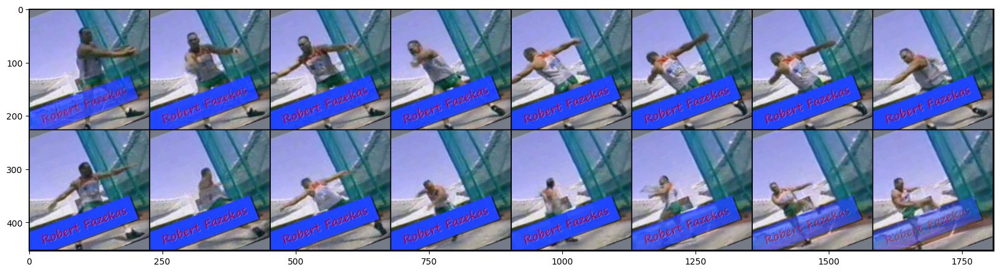

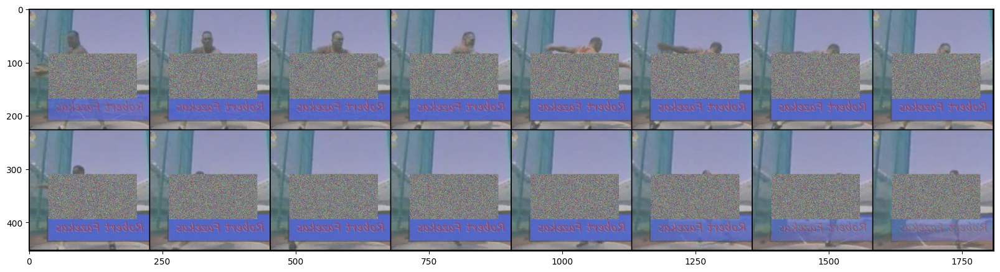

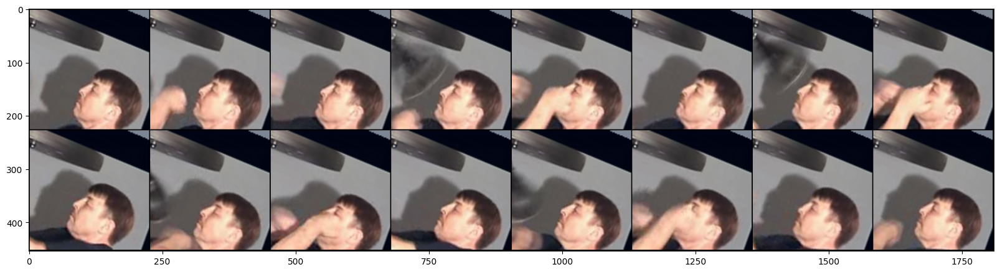

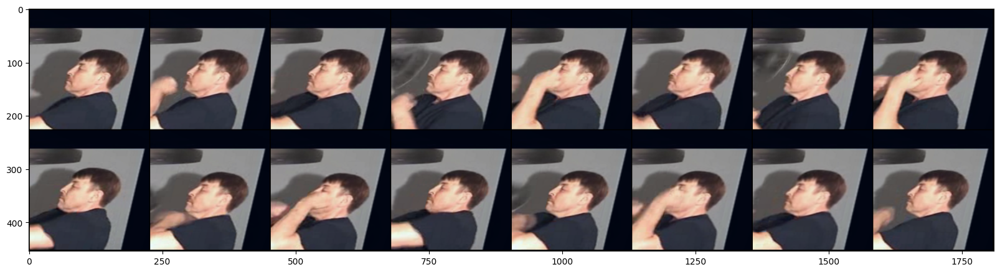

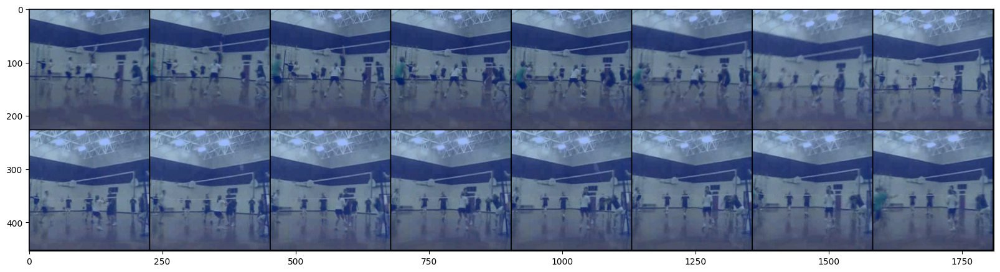

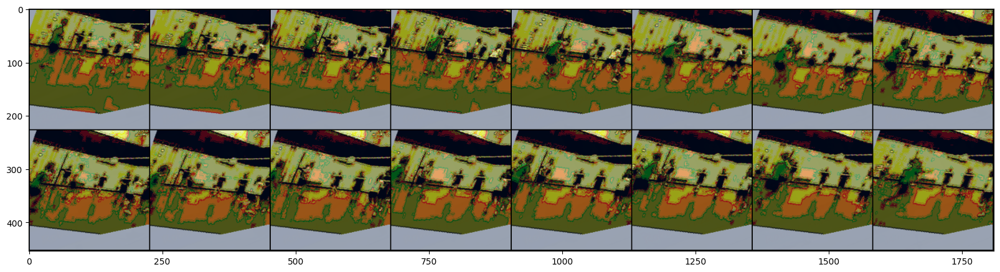

In [7]:
for idx, (samples, targets, _, _) in enumerate(data_loader_train):
    if mixup_fn is not None:
        # mixup handle 3th & 4th dimension
        B,C,T,H,W=samples.shape
        print(f"{B=}, {C=}, {T=}, {H=}, {W=}")
        samples=samples.view(B, C*T, H, W)
        samples, targets=mixup_fn(samples, targets)
        print(f"{samples.shape=}, {targets.shape=}")
        samples=samples.view(B,C,T,H,W)
    break

for bidx in range(samples.shape[0]):
    plt.figure(figsize=(20,10))
    plt.imshow(make_grid(samples[bidx].transpose(0,1),normalize=True).permute(1,2,0))

[mixup](https://github.com/huggingface/pytorch-image-models/blob/main/timm/data/mixup.py)

In [22]:
num_classes=mixup_fn.num_classes
smoothing=mixup_fn.label_smoothing
print(f"{num_classes=}, {smoothing=}")




num_classes=101, smoothing=0.1
off_value=0.0009900990099009901, on_value=0.900990099009901


In [33]:
lam

0.9408544742025675

In [28]:
out[0].sum()

tensor(1.)

In [29]:
out.sum(dim=1)

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000])

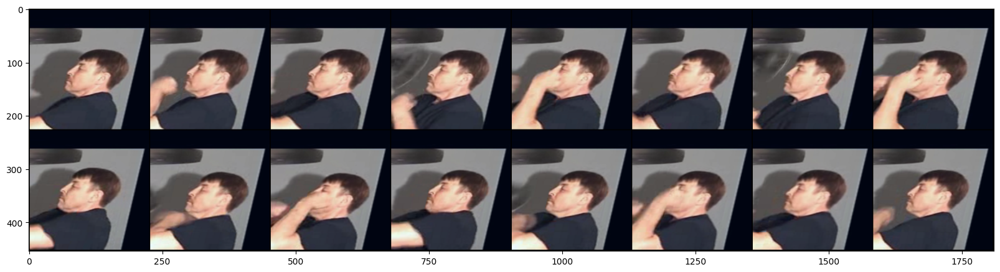

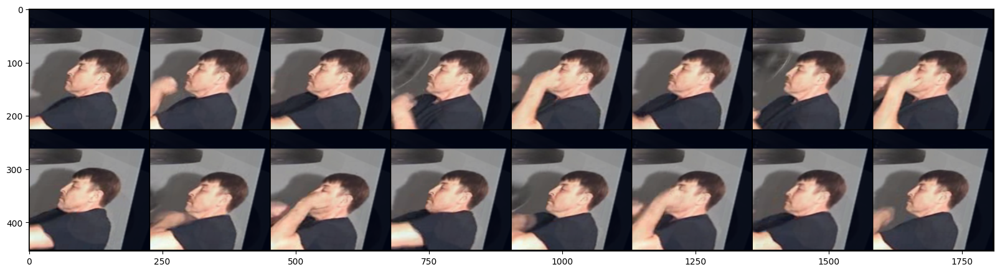

In [19]:
# lam=mixup_fn._mix_batch(x)
# x_origin=samples.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()
# x_mod=x.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()

bidx=3
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_origin[bidx],normalize=True).permute(1,2,0))
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_mod[bidx],normalize=True).permute(1,2,0))

(-4.01946496963501, 3.5811986923217773)

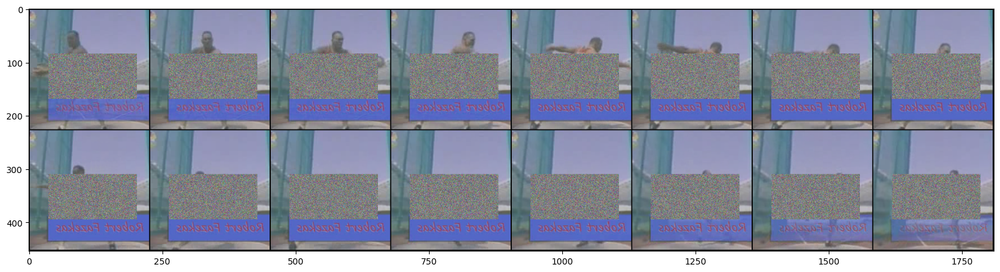

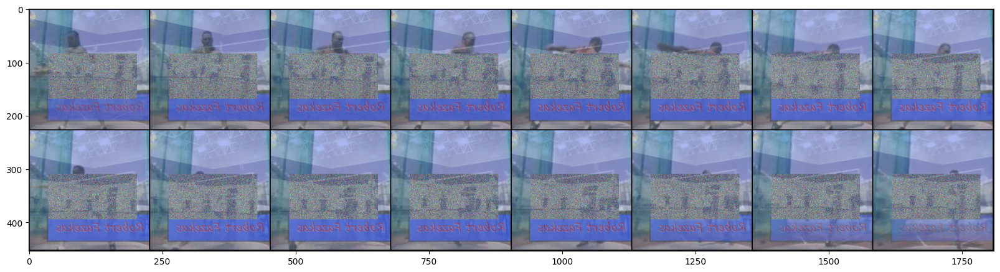

In [15]:
# lam=mixup_fn._mix_pair(x) # lam is the ratio of MixUp/CutMix
# x_origin=samples.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()
# x_mod=x.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()

bidx=1
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_origin[bidx],normalize=True).permute(1,2,0))
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_mod[bidx],normalize=True).permute(1,2,0))

0 5
1 4
2 3


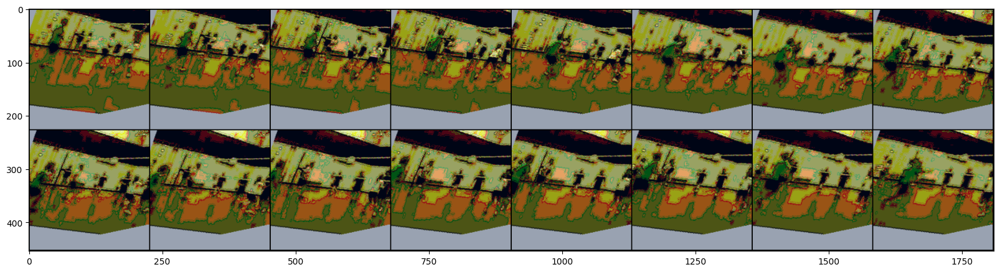

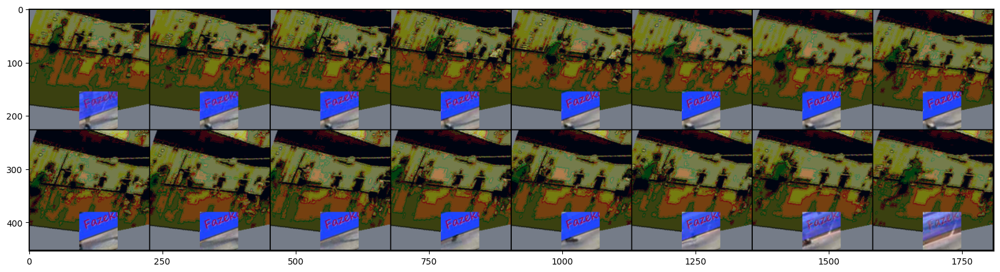

In [23]:
# x_origin=samples.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()
# x_mod=x.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()

bidx=5
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_origin[bidx],normalize=True).permute(1,2,0))
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_mod[bidx],normalize=True).permute(1,2,0))

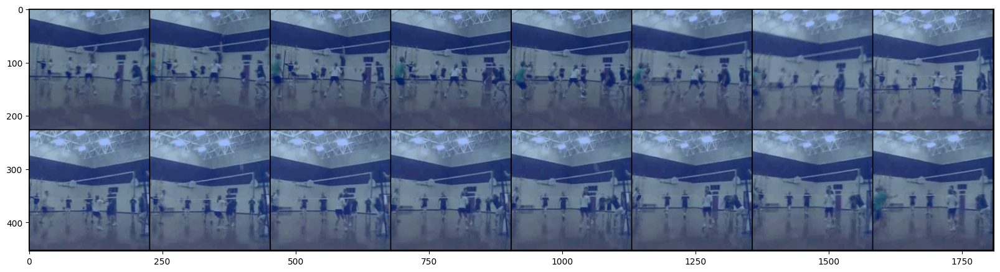

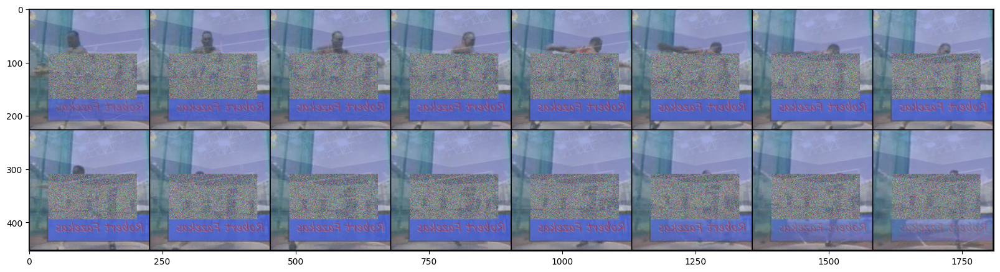

In [9]:
mixup_fn._mix_elem(x)
x_origin=samples.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()
x_mod=x.view(B, C,T, H, W).permute(0,2,1,3,4).contiguous()

bidx=4
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_origin[bidx],normalize=True).permute(1,2,0))
plt.figure(figsize=(20,10))
plt.imshow(make_grid(x_mod[bidx],normalize=True).permute(1,2,0))